### **object detection and tracking create a model that can detect and track objects in real time video feeds**

In [2]:
import cv2
import matplotlib.pyplot as plt

In [35]:
frozen_model = 'frozen_inference_graph.pb'
config_file = "ssd_mobilenet_v3_large_coco_2020_01_14.pbtxt"

DNN - DETECTION MODEL THIS CLASS MODEL REPRESENT HIGH LEVEL API FOR OBJECT DETECTION NETWORK

In [36]:
model = cv2.dnn.DetectionModel(frozen_model, config_file)

In [37]:
# Check if the files exist
!ls frozen_inference_graph.pb
!ls ssd_mobilenet_v2_coco_2020_01_14.pbtxt

# Check the permissions of the files
!ls -l frozen_inference_graph.pb
!ls -l  ssd_mobilenet_v2_coco_2020_01_14.pbtxt

frozen_inference_graph.pb
ls: cannot access 'ssd_mobilenet_v2_coco_2020_01_14.pbtxt': No such file or directory
-rw-r--r-- 1 root root 13448454 Feb  6 06:32 frozen_inference_graph.pb
ls: cannot access 'ssd_mobilenet_v2_coco_2020_01_14.pbtxt': No such file or directory


In [38]:
classLabels = []
file_name = "labels.txt"
with open(file_name, 'rt') as fpt:
  classLabels = fpt.read().rstrip('\n').split('\n')


In [39]:
print(classLabels)

['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'diningtable', 'toilet', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [28]:
print(len(classLabels))

80


Set Input Size => is a size of new input frame
set input scale => scale factor of a value of a frame

In [46]:
!pip install opencv-python
!pip install matplotlib


In [50]:
!pip install pillow

In [51]:
from PIL import Image

In [95]:
model.setInputSize(320,320)
model.setInputScale(1.0/127.5)
model.setInputMean((127.5,127,5,127.5))
model.setInputSwapRB(True)


< cv2.dnn.Model 0x78b4d285e210>

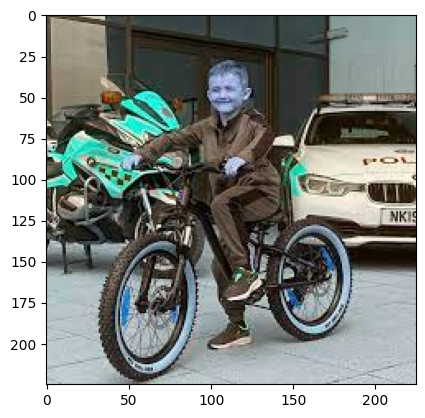

In [100]:
img = cv2.imread('boy.jpg')
plt.imshow(img)


In [101]:
ClassIndex,confidence,bbox = model.detect(img,confThreshold=0.5)

In [102]:
print(ClassIndex)

[1 4 4 3 4]


In [103]:
font_scale = 3
font =cv2.FONT_HERSHEY_PLAIN
for ClassInd,conf,boxes in zip(ClassIndex.flatten(),confidence.flatten(),bbox):
   cv2.rectangle(img,boxes,(255,0,0),3)
   cv2.putText(img,classLabels[ClassInd-1],(boxes[0]+10,boxes[1]+20),font,fontScale = font_scale,color=(0,255,0),thickness=3)

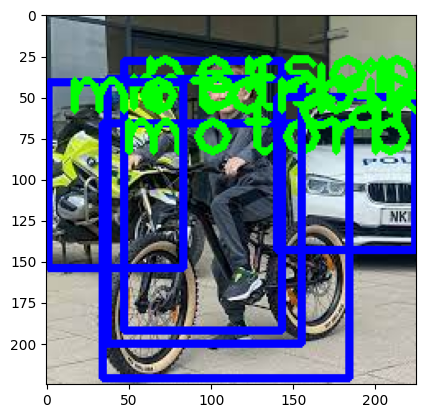

In [104]:
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

In [108]:
cap = cv2.VideoCapture('stockvideo.webm')
if not cap.isOpened():
  cap =cv2.VideoCapture(0)
if not cap.isOpened():
  raise IOError('cant open the video')
font_scale=3
font = cv2.FONT_HERSHEY_PLAIN

while True:
  ret,frame=cap.read()
  ClassIndex,confidece,bbox = model.detect(frame, confThreshold=0.55)
  print(ClassIndex)
  if (len(ClassIndex)!=0):
    for ClassInd,conf,boxes in zip(ClassIndex.flatten(),confidence.flatten(),bbox):
      if(ClassInd<=80):
        cv2.rectangle(img,boxes,(255,0,0),3)
        cv2.putText(img,classLabels[ClassInd-1],(boxes[0]+10,boxes[1]+20),font,fontScale = font_scale,color=(0,255,0),thickness=3)
  cv2.imshow('objdetection by simlilearn',frame)
  if cv2.waitKey(2) & Oxff == ord('q'):
    break
cap.release()
cv2.destroyAllWindows()


error: OpenCV(4.8.0) :-1: error: (-5:Bad argument) in function 'detect'
> Overload resolution failed:
>  - 'coinfThresold' is an invalid keyword argument for dnn_DetectionModel.detect()
>  - 'coinfThresold' is an invalid keyword argument for dnn_DetectionModel.detect()


In [109]:
cap = cv2.VideoCapture('stockvideo.webm')
if not cap.isOpened():
  cap =cv2.VideoCapture(0)
if not cap.isOpened():
  raise IOError('cant open the video')
font_scale=3
font = cv2.FONT_HERSHEY_PLAIN

while True:
  ret,frame=cap.read()
  ClassIndex,confidece,bbox = model.detect(frame, confThreshold=0.55)
  print(ClassIndex)
  if (len(ClassIndex)!=0):
    for ClassInd,conf,boxes in zip(ClassIndex.flatten(),confidence.flatten(),bbox):
      if(ClassInd<=80):
        cv2.rectangle(frame,boxes,(255,0,0),3)
        cv2.putText(frame,classLabels[ClassInd-1],(boxes[0]+10,boxes[1]+20),font,fontScale = font_scale,color=(0,255,0),thickness=3)
  cv2.imshow('objdetection by simlilearn',frame)
  if cv2.waitKey(2) & Oxff == ord('q'):
    break
cap.release()
cv2.destroyAllWindows()

[3 8 8 8 3 3 8 3]


DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


In [110]:
!pip install google.colab.patches

ERROR: Could not find a version that satisfies the requirement google.colab.patches (from versions: none)
ERROR: No matching distribution found for google.colab.patches


In [111]:
from google.colab.patches import cv2_imshow

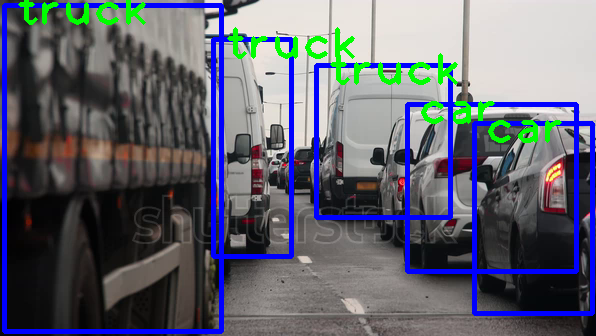

In [112]:
cv2_imshow(frame)

[3 8 8 8 3 3 8 3]


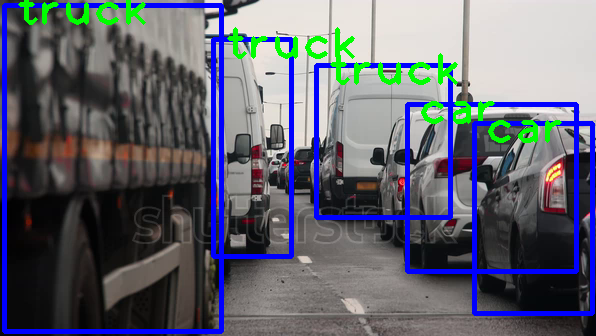

[3 8 8 8 3 3 8 3]


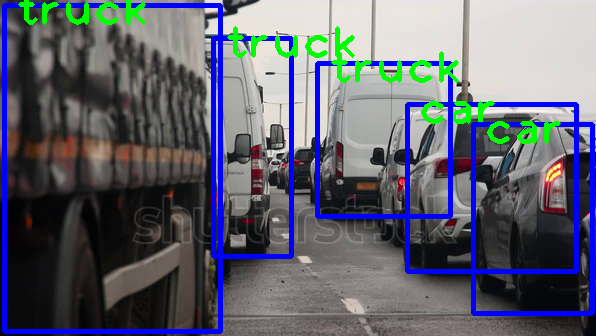

[3 8 8 8 3 3 8 3]


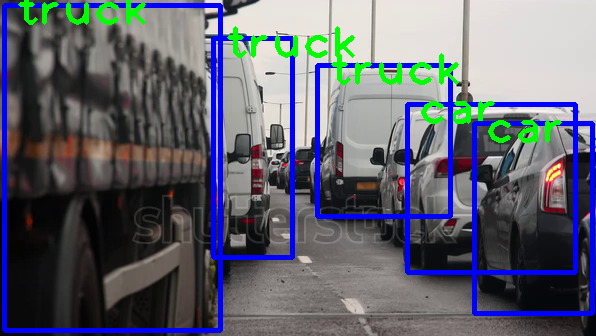

[3 8 8 8 3 3 8 3]


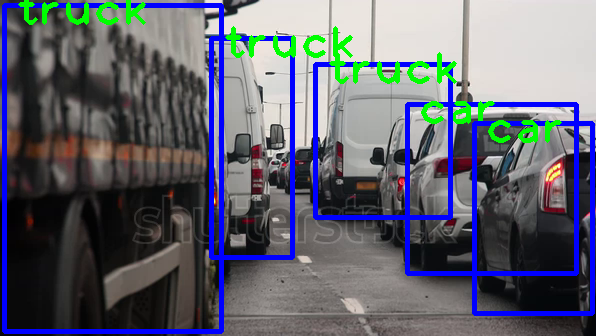

[3 8 8 3 3 8 3 8]


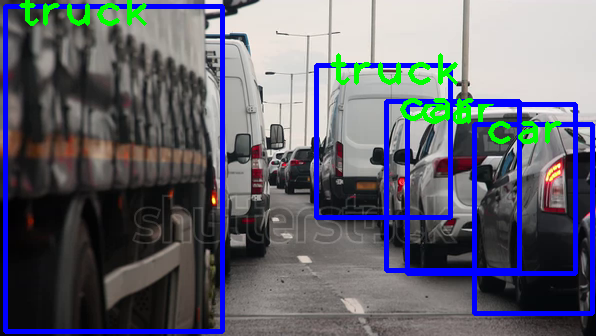

[3 8 8 3 3 3 8 8]


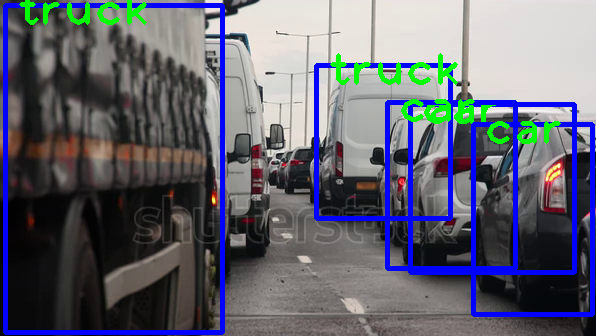

[3 8 3 8 3 8 3 3 8]


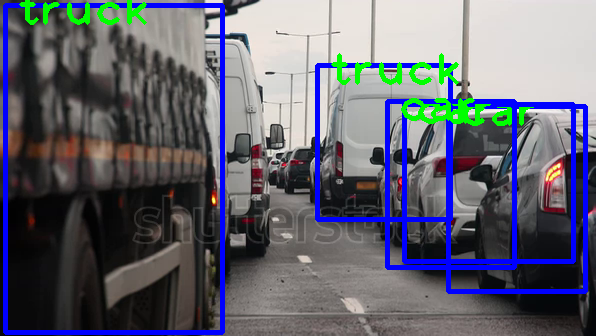

[3 8 3 8 3 3 8 3 8]


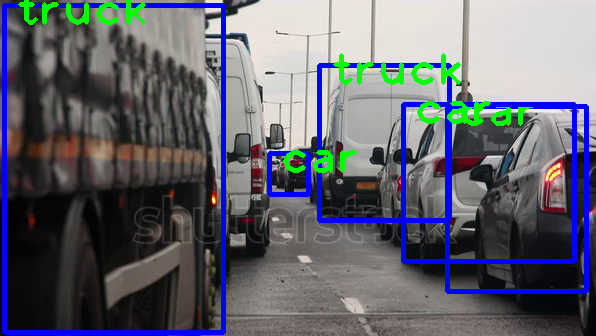

[3 8 3 8 3 8 3 3 8]


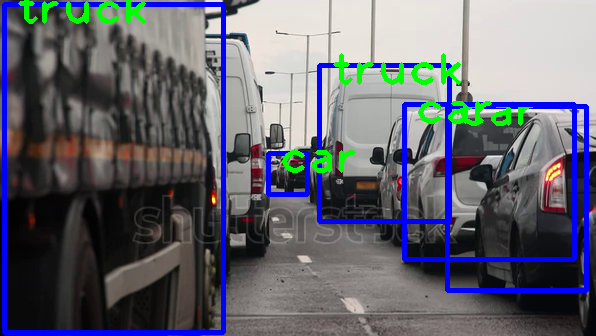

[3 8 3 8 3 8 3 3]


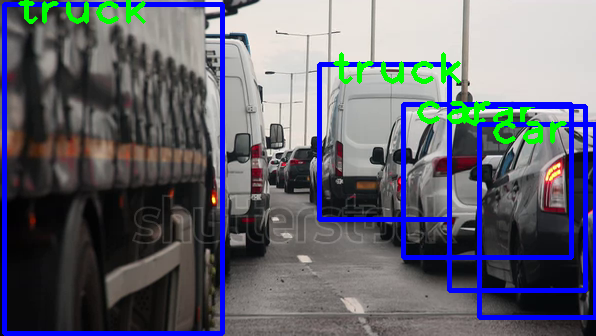

[3 8 3 8 3 3 8 3]


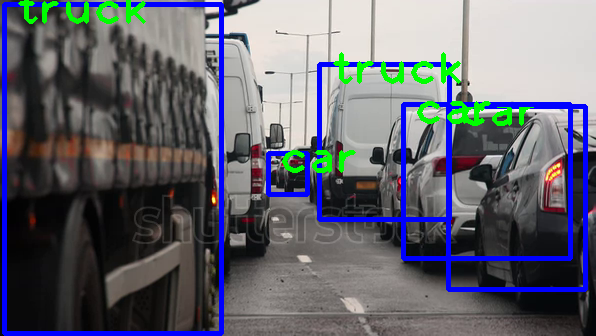

[3 8 8 3 3 3 8]


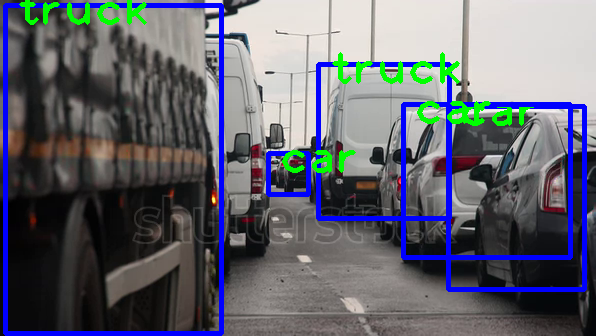

[3 8 8 3 3 3 8]


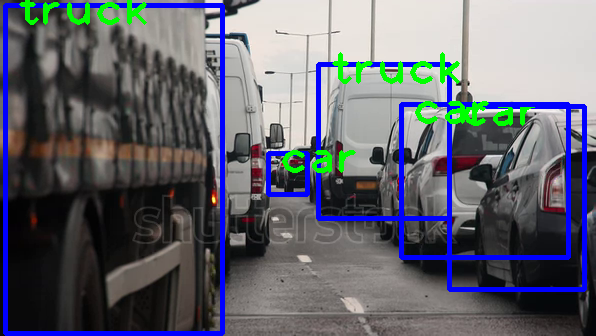

[3 8 8 3 3 3 8]


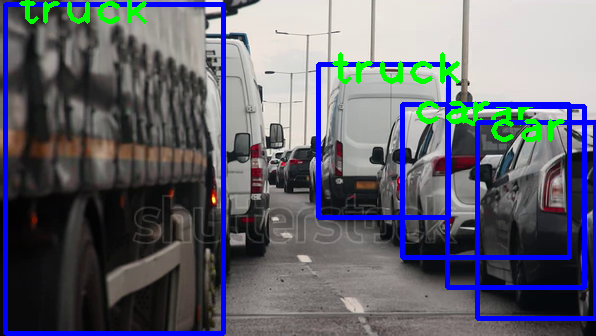

[3 3 8 8 3 3 8]


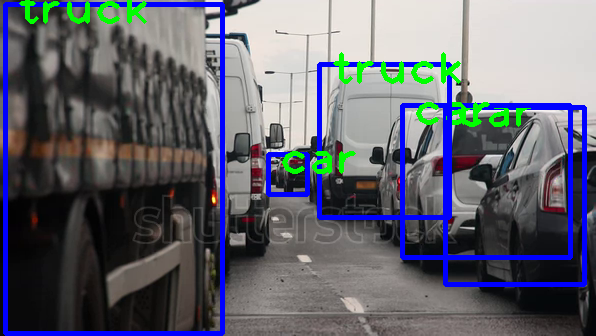

[3 8 3 8 3 3 8]


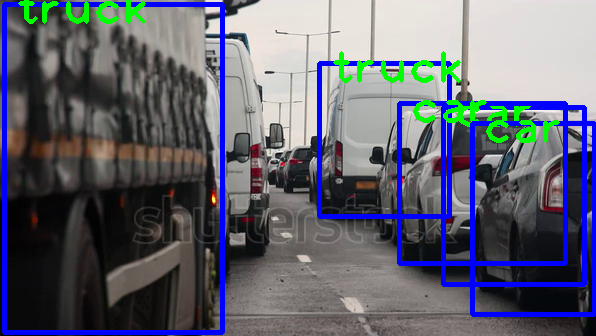

[3 8 3 8 3 3 8]


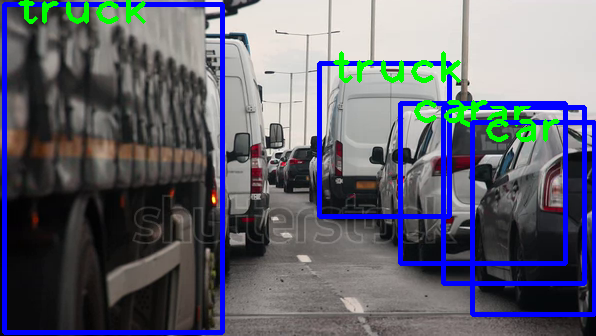

[3 8 3 8 3 3]


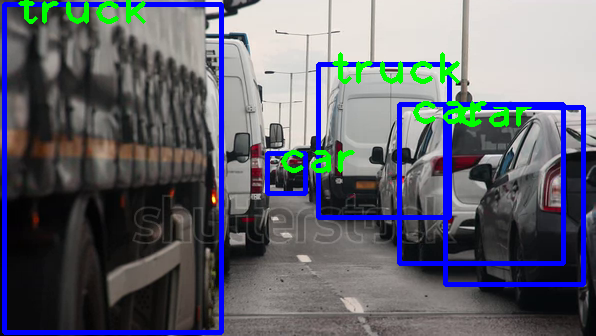

[3 8 3 8 3 3]


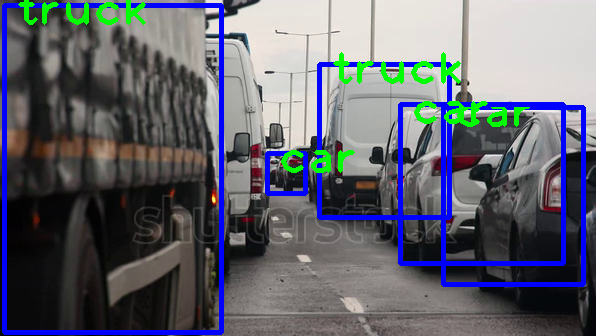

[3 3 8 8 3 3]


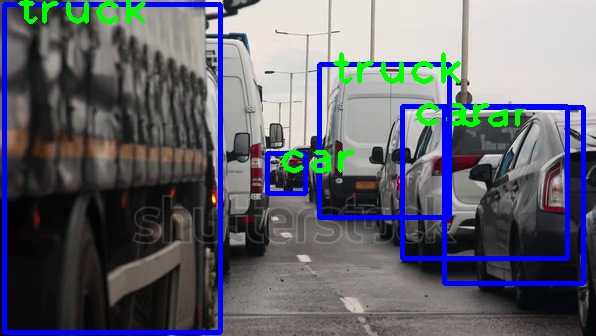

[3 3 8 8 3 3]


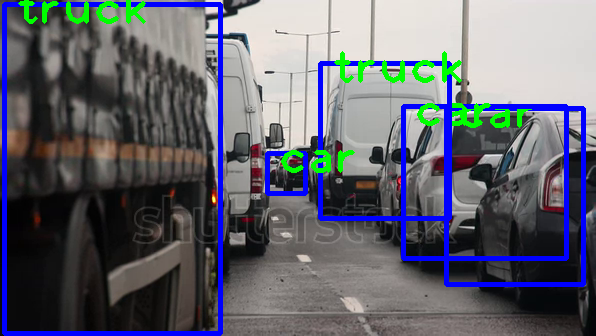

[3 3 8 8 3 3]


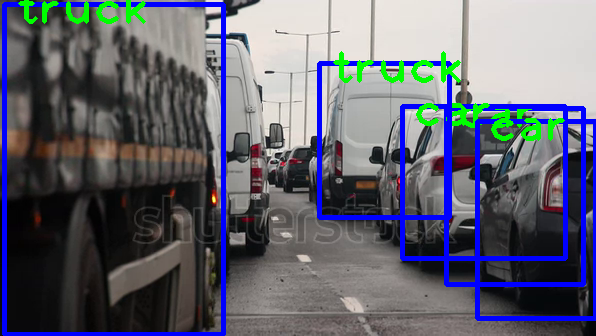

[3 3 8 8 3 3 8]


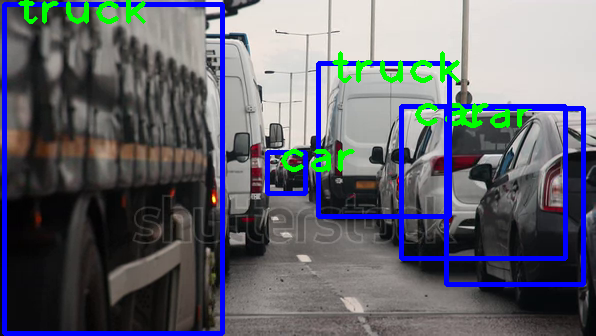

[3 3 8 8 3 3]


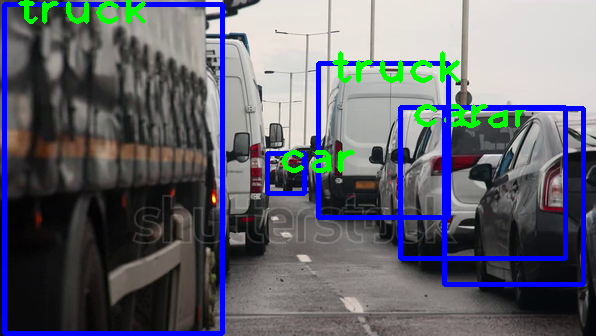

[3 3 8 8 3 3 8]


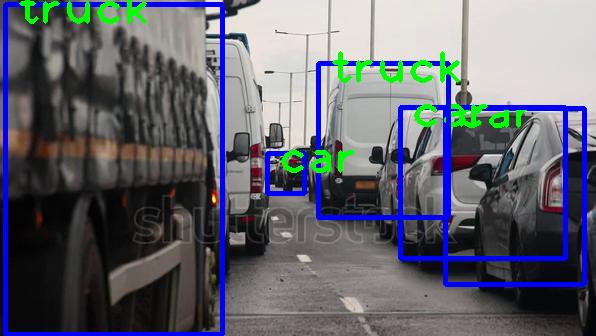

[3 3 8 8 3 3 8]


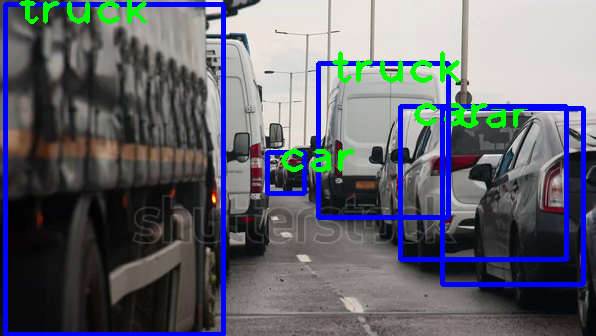

[3 8 3 3 8 3 8]


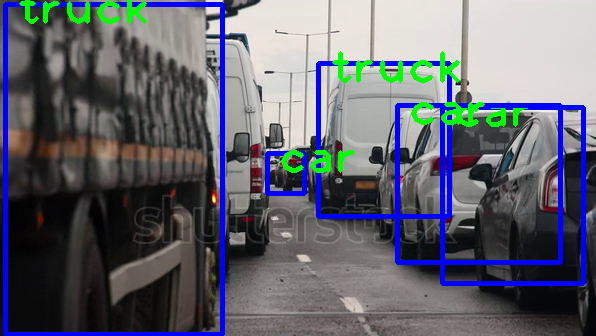

[3 3 8 8 3 3 8]


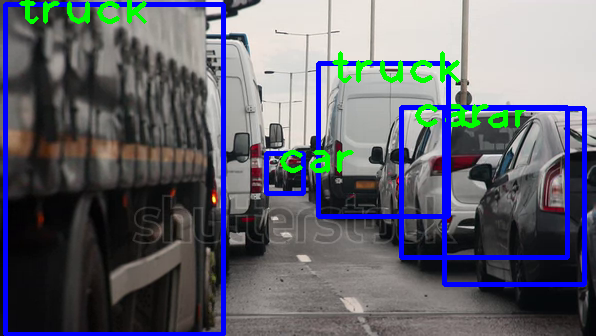

[3 8 3 8 3 3 8]


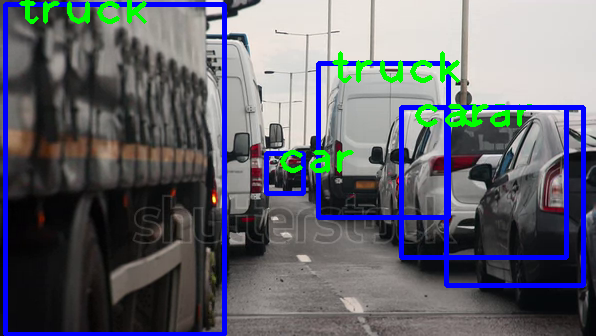

[3 8 3 8 3 3 8]


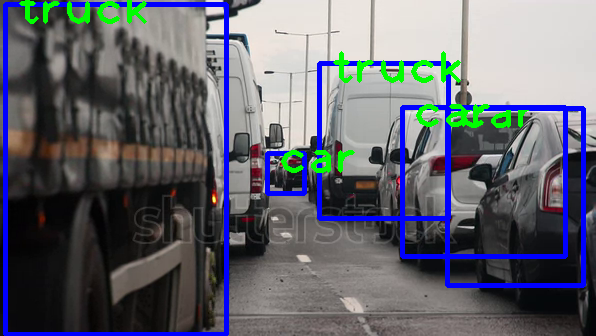

[3 8 3 8 3 3 8]


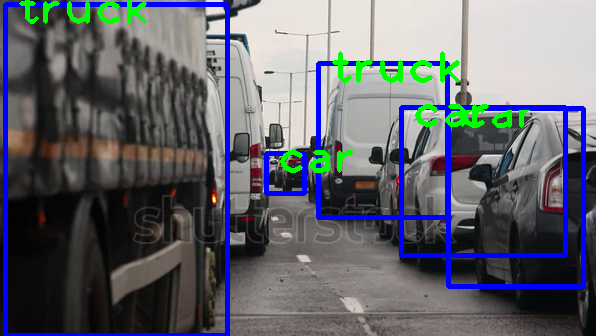

[3 8 3 8 3 3 8]


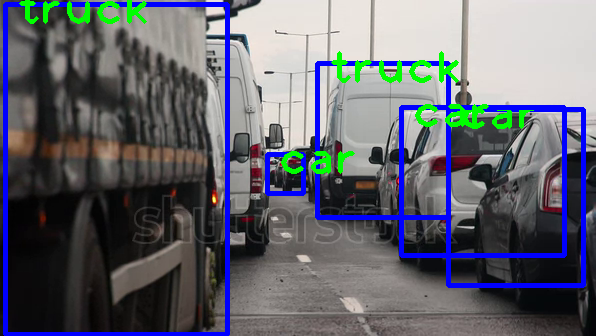

[3 8 3 8 3 3 8]


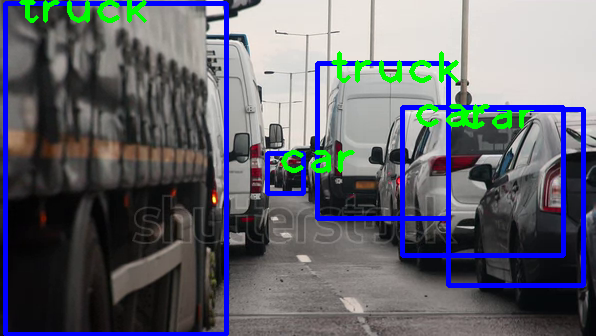

[3 8 3 8 3 3 8]


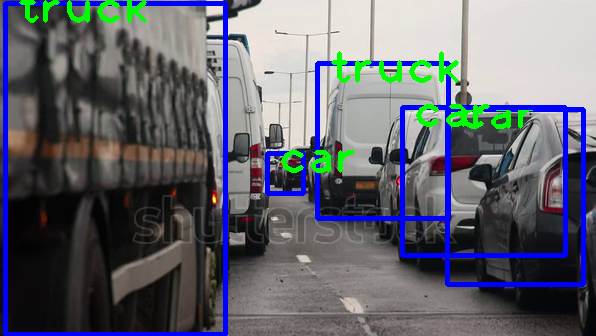

[3 8 3 8 3 3 8]


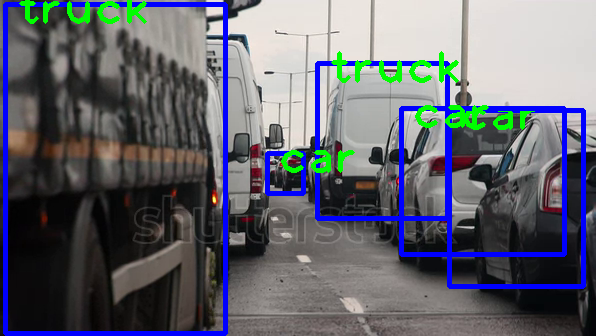

[3 8 3 8 3 3 8]


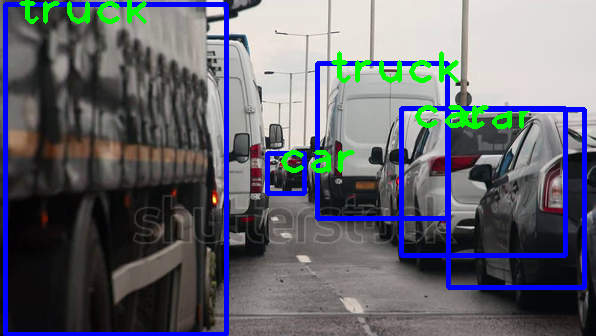

[3 8 3 8 3 3 8]


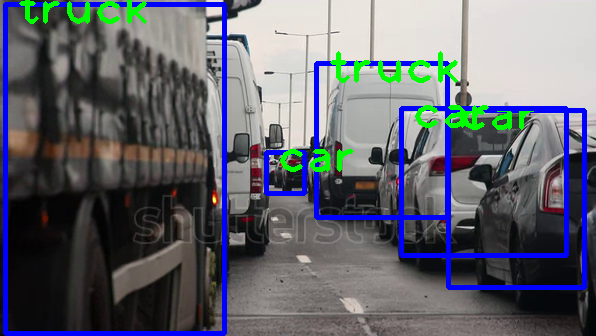

[3 8 3 8 3 8]


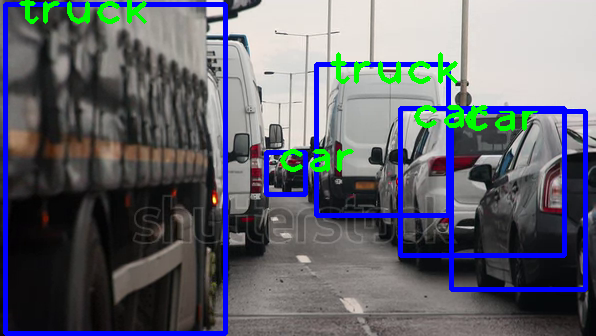

[3 8 3 8 3 8]


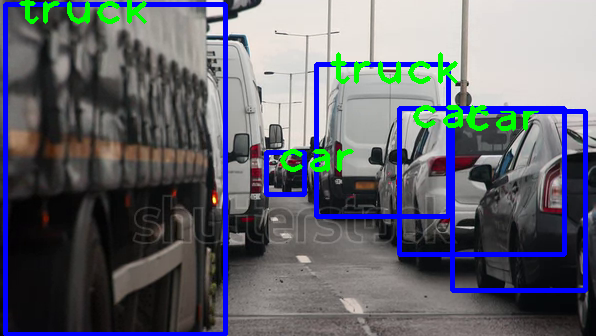

[3 8 3 8 3 8]


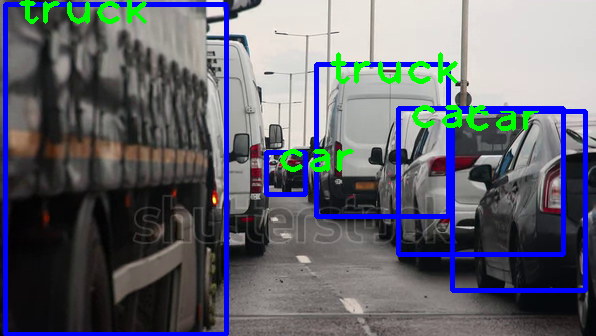

[3 8 3 8 3 8]


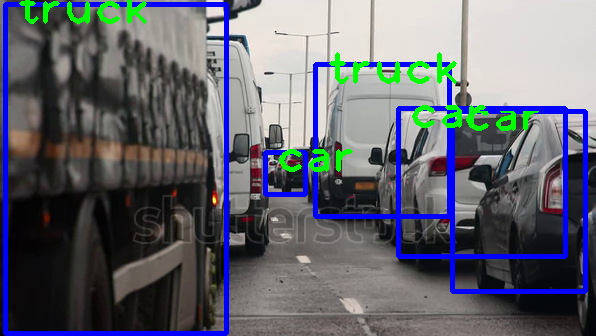

[3 8 3 8 3 8]


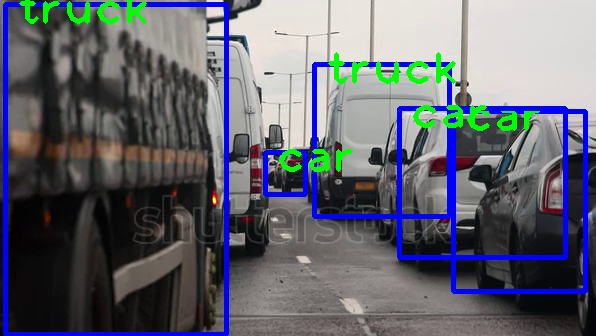

[3 8 3 8 3 8]


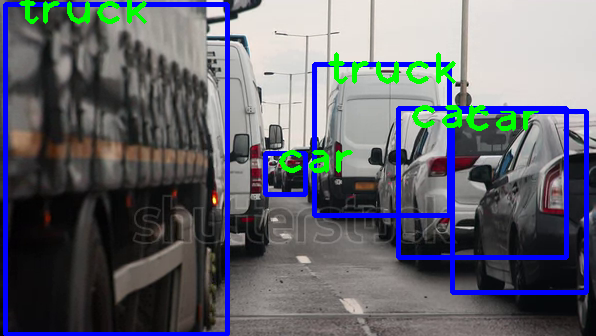

[3 3 8 3 8 8]


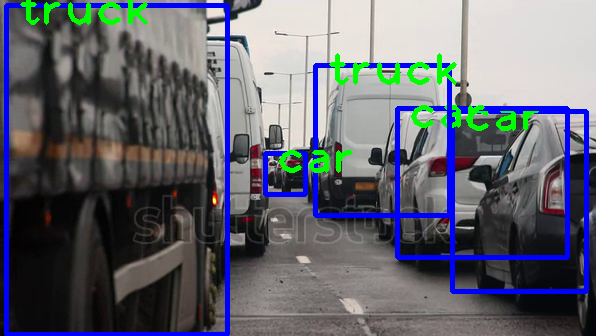

[3 3 8 3 3 8 8]


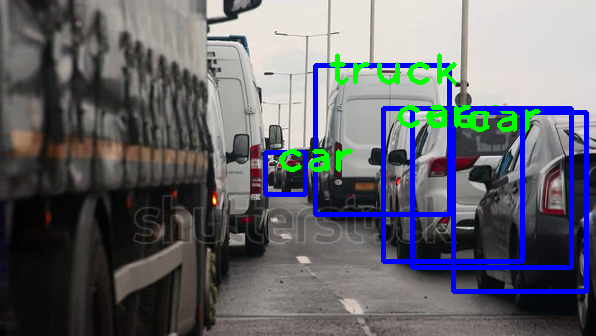

[3 3 8 3 3 8 8]


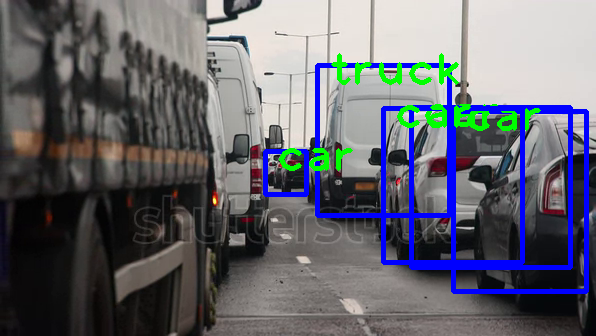

[3 3 8 3 3 8]


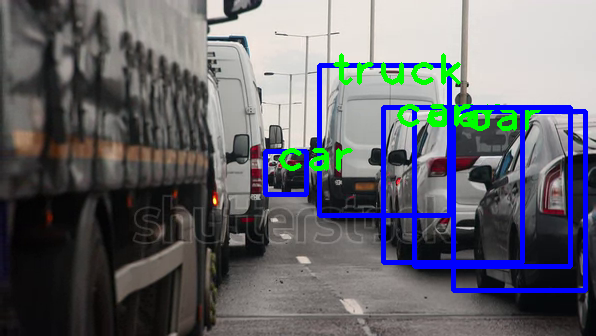

[3 3 8 3 8]


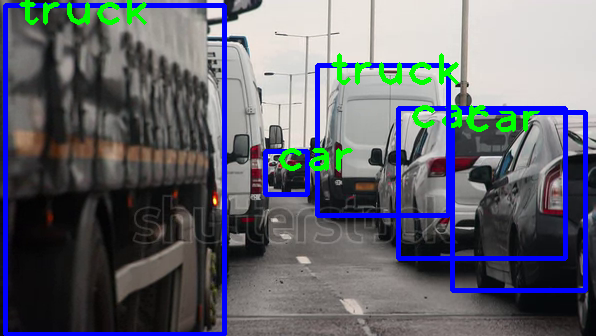

[3 3 8 3 8]


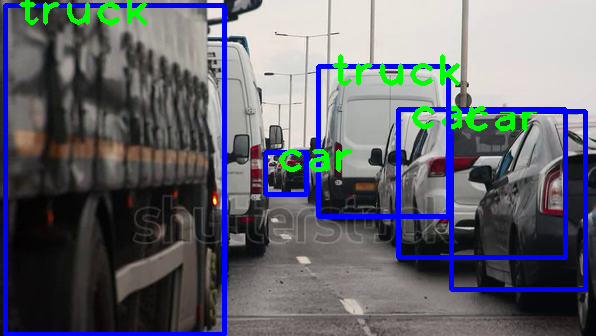

[3 3 8 3 8]


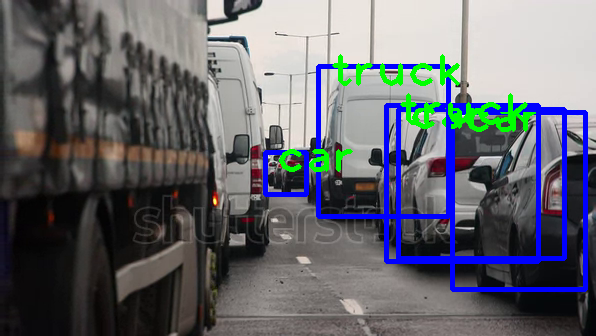

[3 3 8 3]


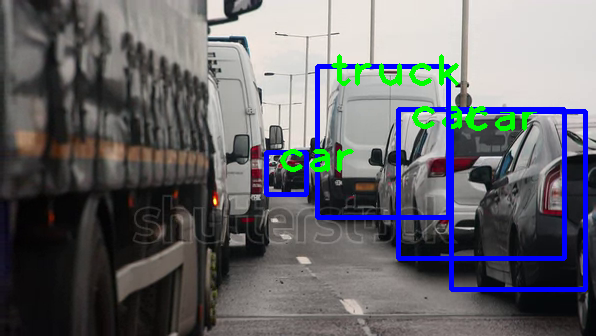

[3 3 8 3 3]


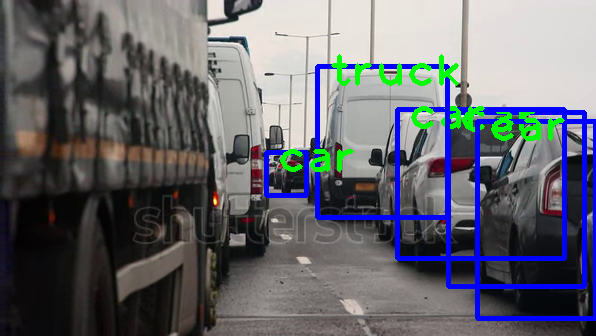

[3 3 8 3]


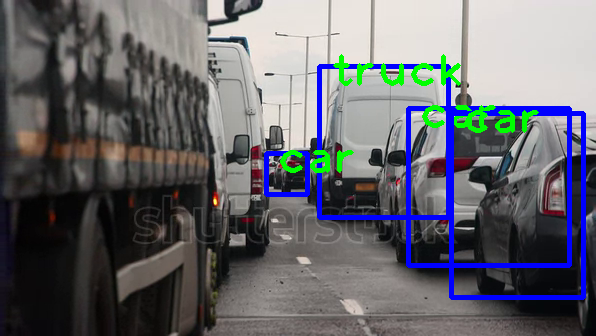

[3 3 8 3]


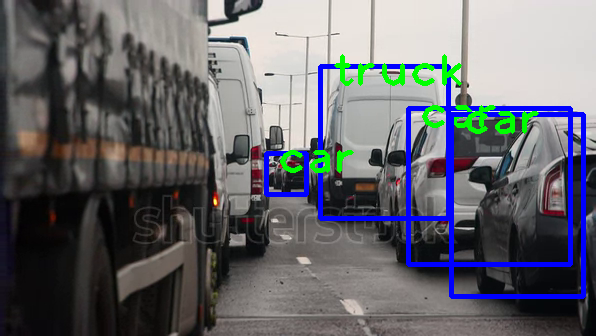

[3 3 8 3]


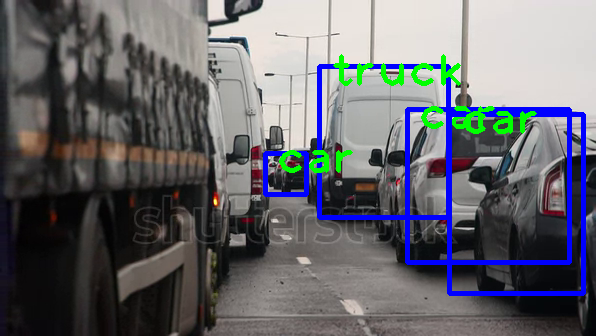

[3 3 3 8]


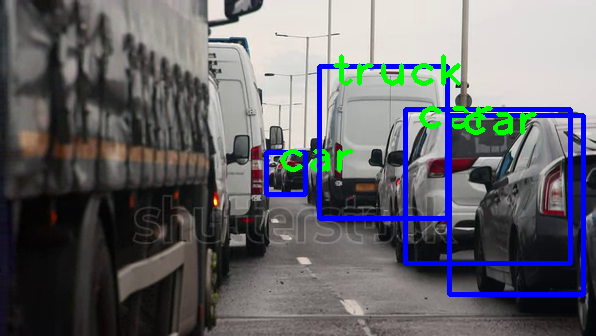

[3 3 8 3]


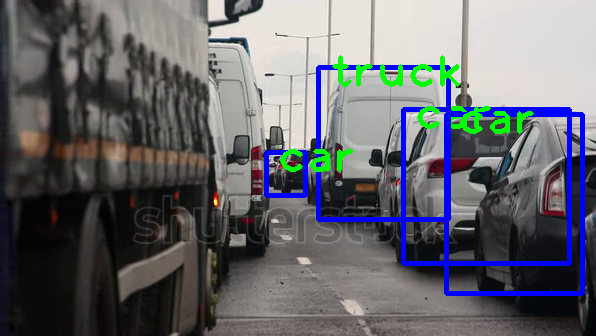

[3 3 8 3 3]


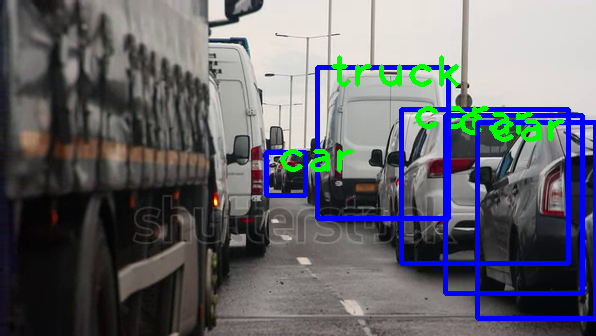

[3 3 8 3 3]


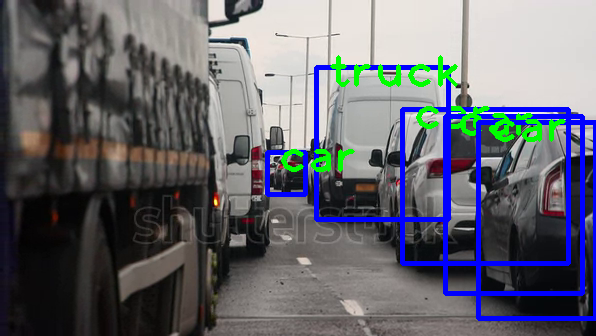

[3 3 8 3 3]


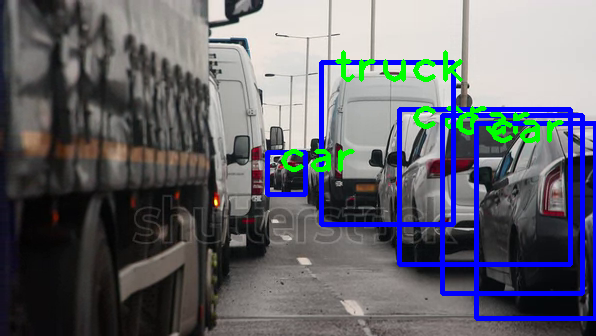

[3 3 8 3 3]


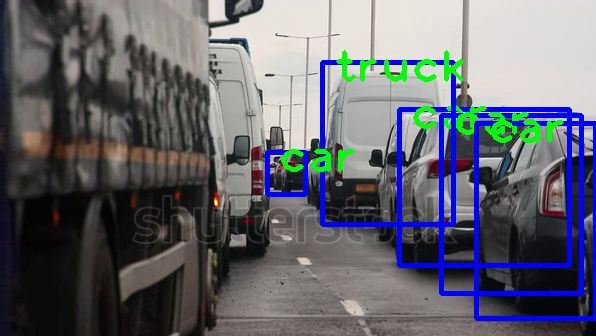

[3 3 8 3 3]


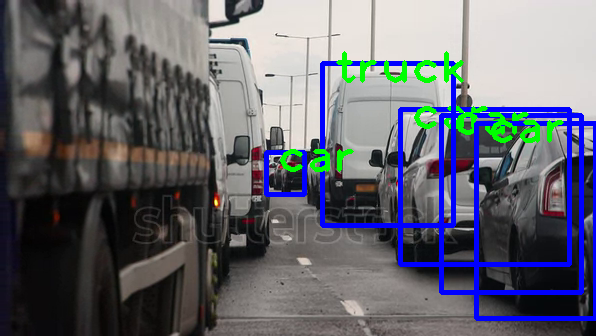

[3 3 8 3 3]


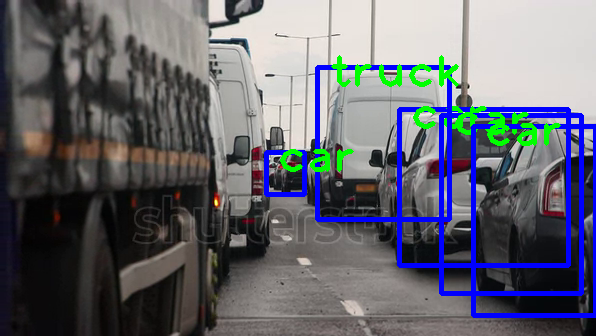

[3 3 8 3 3 8]


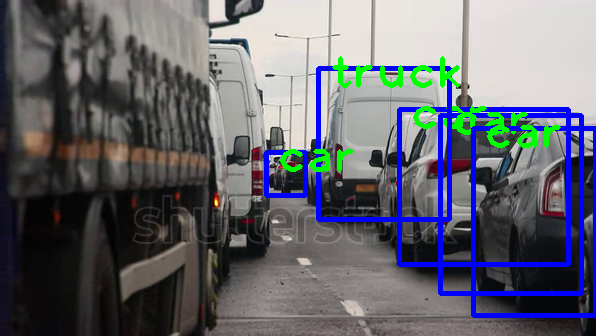

[3 3 8 3 3 8 8 8]


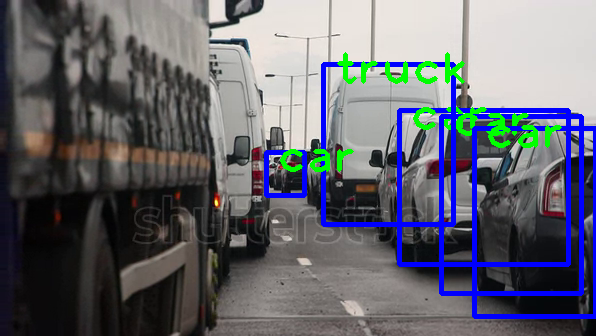

[3 3 8 3 3 8]


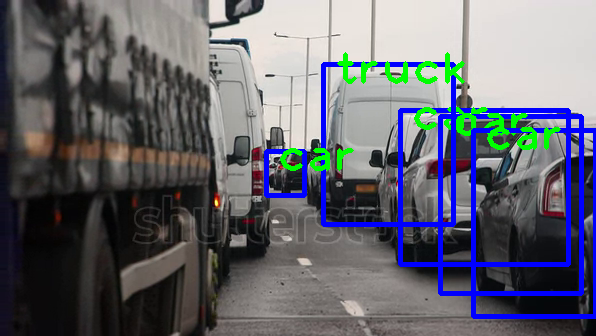

[3 3 8 3 3 8 8]


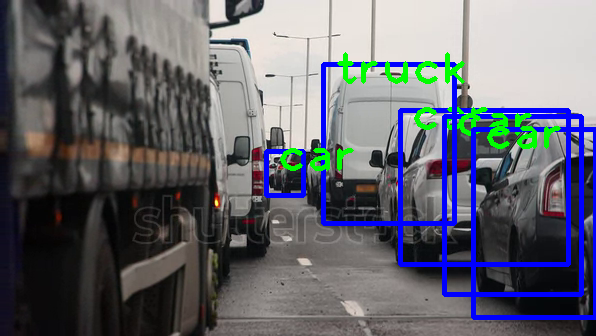

[3 3 8 3 3 8]


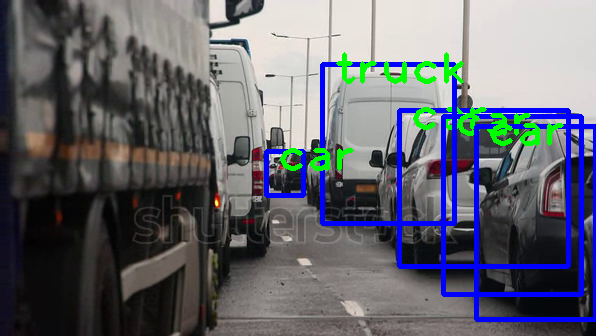

[3 3 8 3 3 8]


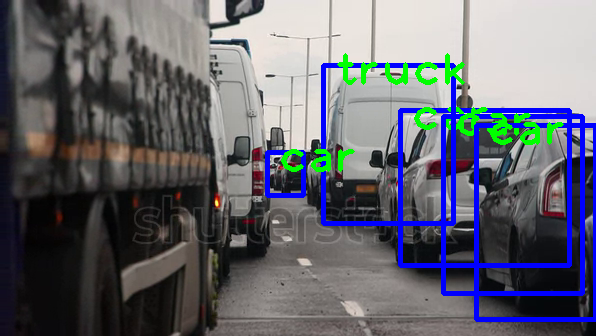

[3 3 8 3 3 8]


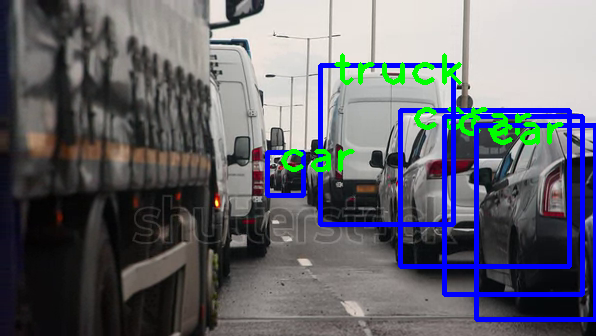

[3 3 8 3 3]


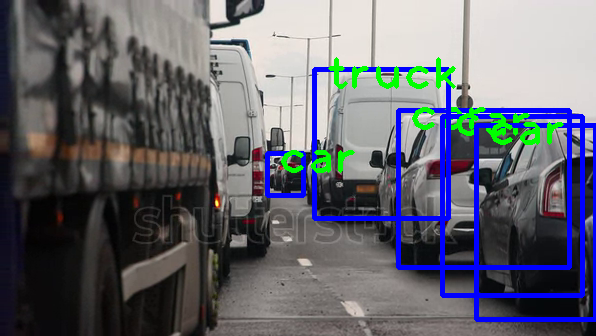

[3 3 8 3 3]


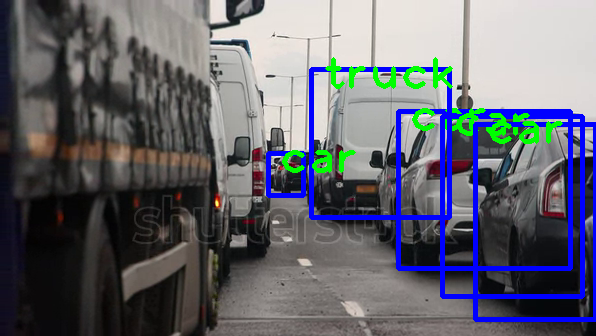

[3 3 8 3 3 8]


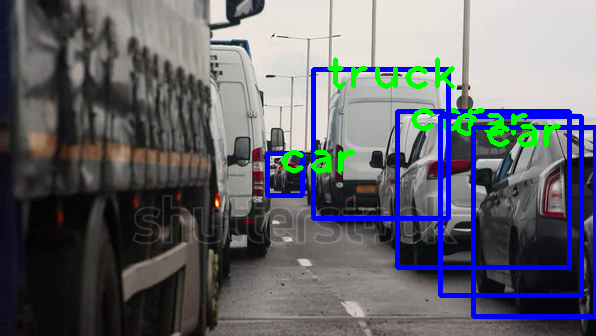

[3 8 3 3 8 8]


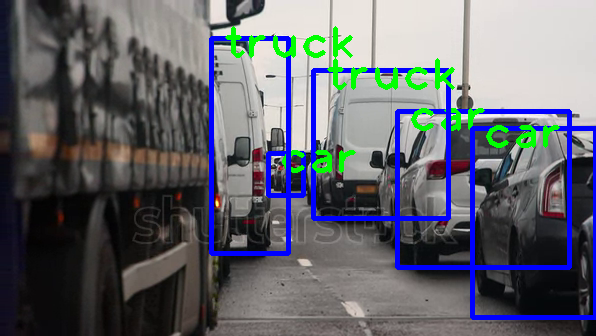

[3 8 3 3 8 8]


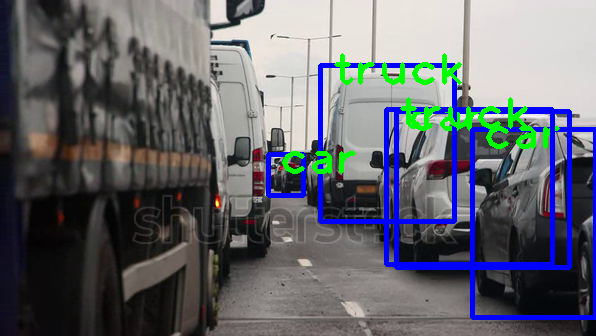

[3 8 3 3 8]


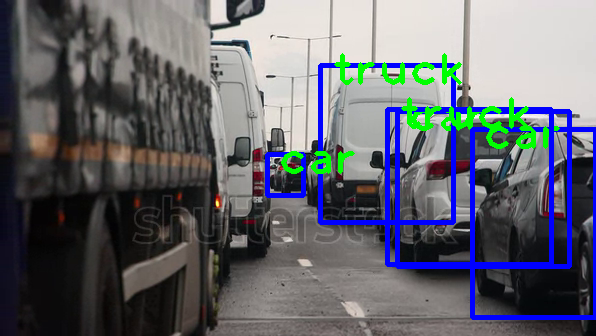

[3 8 3 3 8]


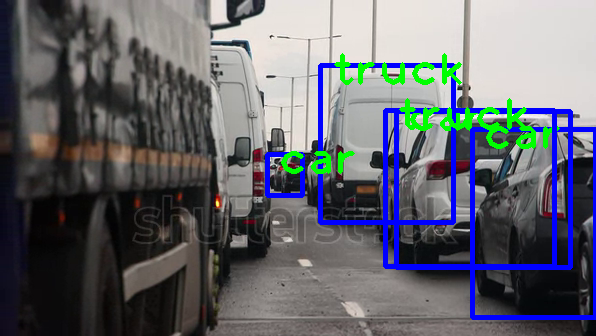

[3 3 8 3 3 8]


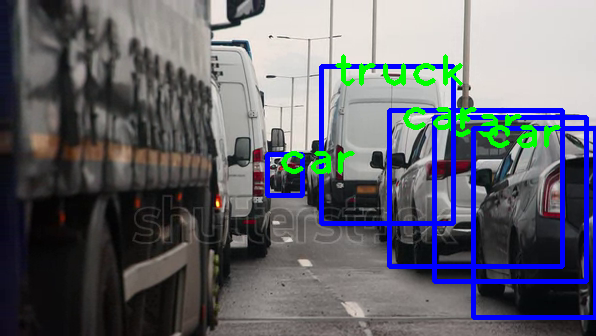

[3 8 3 3 8]


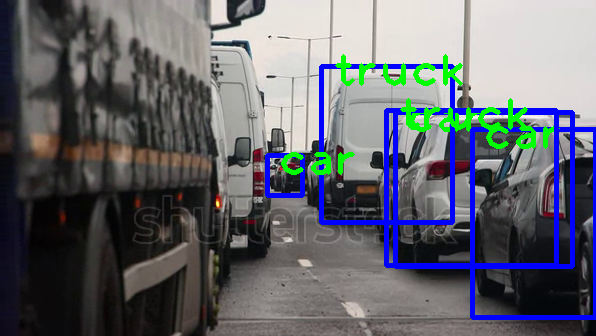

KeyboardInterrupt: 

In [119]:
cap = cv2.VideoCapture('stockvideo.webm')
if not cap.isOpened():
  cap =cv2.VideoCapture(0)
if not cap.isOpened():
  raise IOError('cant open the video')
font_scale=3
font = cv2.FONT_HERSHEY_PLAIN

while True:
  ret,frame=cap.read()
  ClassIndex,confidece,bbox = model.detect(frame, confThreshold=0.55)
  print(ClassIndex)
  if (len(ClassIndex)!=0):
    for ClassInd,conf,boxes in zip(ClassIndex.flatten(),confidence.flatten(),bbox):
      if(ClassInd<=80):
        cv2.rectangle(frame,boxes,(255,0,0),3)
        cv2.putText(frame,classLabels[ClassInd-1],(boxes[0]+10,boxes[1]+20),font,fontScale = font_scale,color=(0,255,0),thickness=3)
  cv2_imshow(frame)
  if cv2.waitKey(2) & 0xFF == ord('q'):
    break
cap.release()
cv2.destroyAllWindows()